In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os, sys
import datetime as dt
from os import listdir
import json
import matplotlib.image as mpimg
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
from PIL import Image, ImageDraw
from math import ceil


In [2]:
log = open("1014_/asdf.txt", "r").readlines()
ids = open("1014_/id.txt",   "r").readlines()

In [3]:
count = 0
pc = []


for l in log:
#     print(l.split(',')[2])
    try:
        pc.append(dt.datetime.strptime(l.split(',')[2][:-1], '%a %b  %d %H:%M:%S %Y') )
    except:
        print(l, count)
    count +=1 
print(count, '\t', log[0])#, times)

513 	 80,1447,Wed Oct 14 21:45:22 2020



In [4]:
phone = []
count = 0
for l in ids:
#     print(l.split(',')[2])
#     print(l.split('.')[0].split("e_")[1])
    try:
        phone.append(dt.datetime.strptime(l.split('.')[0].split("e_")[1], '%Y%m%d_%H%M%S') )
    except:
        print(l, count)
    count +=1 
print(count, '\t', ids[0])

784 	 VeggieCamera_crops_device_20201014_174424.json



In [5]:
new = []
for eachimgTime in phone:
    dis = dt.timedelta(0, 999999)
    a = None
    for eachpcTime in pc:
        if dis > abs(eachimgTime- eachpcTime):
            dis = abs(eachimgTime- eachpcTime)
            a = eachpcTime
    if dt.timedelta(0,5) > dis:
        if a > dt.datetime(2020, 10, 6, 15, 0, 0):
            new.append([eachimgTime, a, dis])

In [6]:
c = 0
cc = 0

dir = "1014_"
for (imgTime, pcTime, _) in new:
    imgfname_json = imgTime.strftime("VeggieCamera_crops_device_%Y%m%d_%H%M%S.json")
    imgfname_rgbs = imgTime.strftime("VeggieCamera_crops_picture_%Y%m%d_%H%M%S.jpg")
    c+=1
    print(c, os.path.isfile(dir+ "/json/"+imgfname_json), os.path.isfile(dir+ "/jpg/"+imgfname_rgbs), imgfname_rgbs)
    if (os.path.isfile(dir+ "/json/"+imgfname_json)and os.path.isfile(dir+ "/jpg/"+imgfname_rgbs)):
        cc+=1

s = listdir(dir+ "/jpg/")

jpgs = []
count = 0
for l in ids:
#     print(l.split(',')[2])
#     print(l.split('.')[0].split("e_")[1])
    try:
        jpgs.append(dt.datetime.strptime(l.split('.')[0].split("e_")[1], '%Y%m%d_%H%M%S') )
    except:
        print(l, count)
    count +=1 
print(count, '\t', jpgs[0])


1 True True VeggieCamera_crops_picture_20201014_214522.jpg
2 True True VeggieCamera_crops_picture_20201014_214532.jpg
3 True True VeggieCamera_crops_picture_20201014_214543.jpg
4 True True VeggieCamera_crops_picture_20201014_214559.jpg
5 True True VeggieCamera_crops_picture_20201014_214608.jpg
6 True True VeggieCamera_crops_picture_20201014_214618.jpg
7 True True VeggieCamera_crops_picture_20201014_214634.jpg
8 True True VeggieCamera_crops_picture_20201014_214645.jpg
9 True True VeggieCamera_crops_picture_20201014_214655.jpg
10 True True VeggieCamera_crops_picture_20201014_214711.jpg
11 True True VeggieCamera_crops_picture_20201014_214721.jpg
12 True True VeggieCamera_crops_picture_20201014_214731.jpg
13 True True VeggieCamera_crops_picture_20201014_214747.jpg
14 True True VeggieCamera_crops_picture_20201014_214757.jpg
15 True True VeggieCamera_crops_picture_20201014_214807.jpg
16 True True VeggieCamera_crops_picture_20201014_214823.jpg
17 True True VeggieCamera_crops_picture_20201014_

306 True True VeggieCamera_crops_picture_20201014_224623.jpg
307 True True VeggieCamera_crops_picture_20201014_224639.jpg
308 True True VeggieCamera_crops_picture_20201014_224649.jpg
309 True True VeggieCamera_crops_picture_20201014_224659.jpg
310 True True VeggieCamera_crops_picture_20201014_224715.jpg
311 True True VeggieCamera_crops_picture_20201014_224725.jpg
312 True True VeggieCamera_crops_picture_20201014_224735.jpg
313 True True VeggieCamera_crops_picture_20201014_224751.jpg
314 True True VeggieCamera_crops_picture_20201014_224801.jpg
315 True True VeggieCamera_crops_picture_20201014_224811.jpg
316 True True VeggieCamera_crops_picture_20201014_224827.jpg
317 True True VeggieCamera_crops_picture_20201014_224837.jpg
318 True True VeggieCamera_crops_picture_20201014_224847.jpg
319 True True VeggieCamera_crops_picture_20201014_224903.jpg
320 True True VeggieCamera_crops_picture_20201014_224913.jpg
321 True True VeggieCamera_crops_picture_20201014_224923.jpg
322 True True VeggieCame

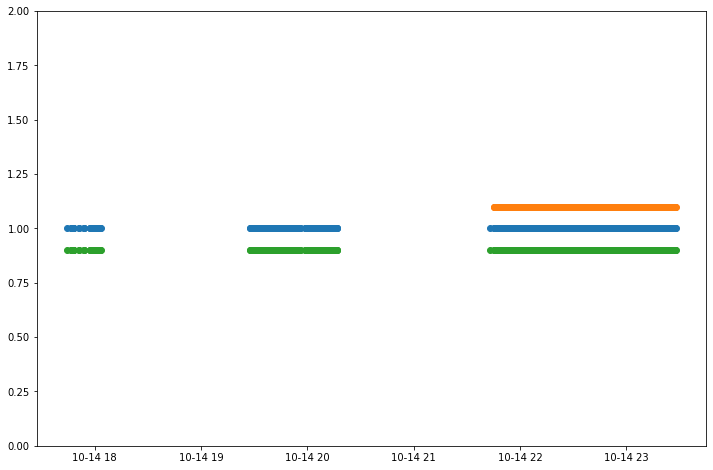

In [7]:
import matplotlib.pyplot as plt
from matplotlib.dates import (YEARLY, DateFormatter,
                              rrulewrapper, RRuleLocator, drange)
import numpy as np
import datetime

fig, ax = plt.subplots(figsize=(12,8))

plt.plot_date(phone, [1]*len(phone))
plt.plot_date(pc, [1.1]*len(pc))

plt.plot_date(jpgs, [0.9]*len(jpgs))
plt.ylim([0, 2])

plt.show()

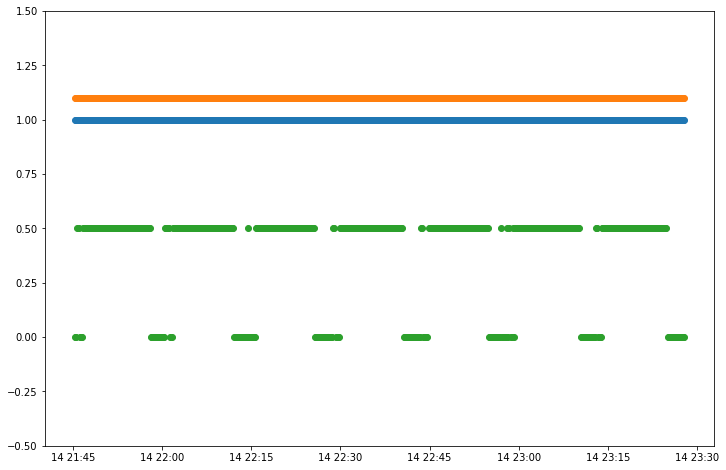

513 513 513


In [8]:
import matplotlib.pyplot as plt
from matplotlib.dates import (YEARLY, DateFormatter,
                              rrulewrapper, RRuleLocator, drange)
import numpy as np
import datetime

fig, ax = plt.subplots(figsize=(12,8))

_pc_ = []
_ph_ = []
____ = []
for n in new:
    _pc_.append(n[1])
    _ph_.append(n[0])
    ____.append(n[2].total_seconds()/2)
plt.plot_date(_pc_, [1]*len(_pc_))
plt.plot_date(_ph_, [1.1]*len(_pc_))
plt.plot_date(_pc_, ____)

plt.ylim([-.5, 1.5])

plt.show()
print(len(new), len(_ph_), len(_pc_))

In [9]:
_ph_img_jpgs_  = []
_ph_img_jsons_ = []
_ph_img_jsons_pitch = []
_pc_zenith     = []
_pc_camang     = []

# _allpc_ = _pc_
# _pc_ = []
_tmptime_ = []
c  = 0
cc = 0
ccc= 0
for (imgTime, pcTime, _) in new:
    imgfname_json = imgTime.strftime("VeggieCamera_crops_device_%Y%m%d_%H%M%S.json")
    imgfname_rgbs = imgTime.strftime("VeggieCamera_crops_picture_%Y%m%d_%H%M%S.jpg")
    c+=1
    #     print(c, os.path.isfile("1006/jsons/"+imgfname_json), os.path.isfile("1006/jpgs/"+imgfname_rgbs), imgfname_rgbs)
    if (os.path.isfile(dir+ "/json/"+imgfname_json)and os.path.isfile(dir+ "/jpg/"+imgfname_rgbs)):
        cc+=1
        _ph_img_jpgs_.append(dir+ "/jpg/"   + imgfname_rgbs)
        _ph_img_jsons_.append(dir+ "/json/" + imgfname_json)
        
        tmp_dict = json.loads(open(dir+ "/json/" + imgfname_json, 'r').read())

        
        
        tmp = pcTime.strftime('%H:%M:%S %Y')
        for __log__ in log:
            if tmp in __log__:
                print(__log__, end = '')
                ccc+=1
                _pc_zenith.append(float(__log__.split(',')[0]))
                _pc_camang.append(int(float(__log__.split(',')[1])))
                _tmptime_.append(tmp)
                _ph_img_jsons_pitch.append(float(tmp_dict['Pitch']))

#                 _pc_.append(_allpc_[c])
                
print(c, cc, ccc)
# print(_pc_camang)

80,1447,Wed Oct 14 21:45:22 2020
80,1595,Wed Oct 14 21:45:32 2020
80,1600,Wed Oct 14 21:45:42 2020
79,1444,Wed Oct 14 21:45:58 2020
79,1591,Wed Oct 14 21:46:08 2020
79,1600,Wed Oct 14 21:46:18 2020
78,1441,Wed Oct 14 21:46:34 2020
78,1586,Wed Oct 14 21:46:44 2020
78,1600,Wed Oct 14 21:46:54 2020
77,1439,Wed Oct 14 21:47:10 2020
77,1581,Wed Oct 14 21:47:20 2020
77,1600,Wed Oct 14 21:47:30 2020
76,1436,Wed Oct 14 21:47:46 2020
76,1576,Wed Oct 14 21:47:56 2020
76,1600,Wed Oct 14 21:48:06 2020
75,1433,Wed Oct 14 21:48:22 2020
75,1571,Wed Oct 14 21:48:32 2020
75,1600,Wed Oct 14 21:48:42 2020
74,1430,Wed Oct 14 21:48:58 2020
74,1565,Wed Oct 14 21:49:08 2020
74,1600,Wed Oct 14 21:49:18 2020
73,1426,Wed Oct 14 21:49:34 2020
73,1560,Wed Oct 14 21:49:44 2020
73,1600,Wed Oct 14 21:49:54 2020
72,1423,Wed Oct 14 21:50:10 2020
72,1555,Wed Oct 14 21:50:20 2020
72,1600,Wed Oct 14 21:50:30 2020
71,1420,Wed Oct 14 21:50:46 2020
71,1549,Wed Oct 14 21:50:56 2020
71,1600,Wed Oct 14 21:51:06 2020
70,1416,We

513 513 513


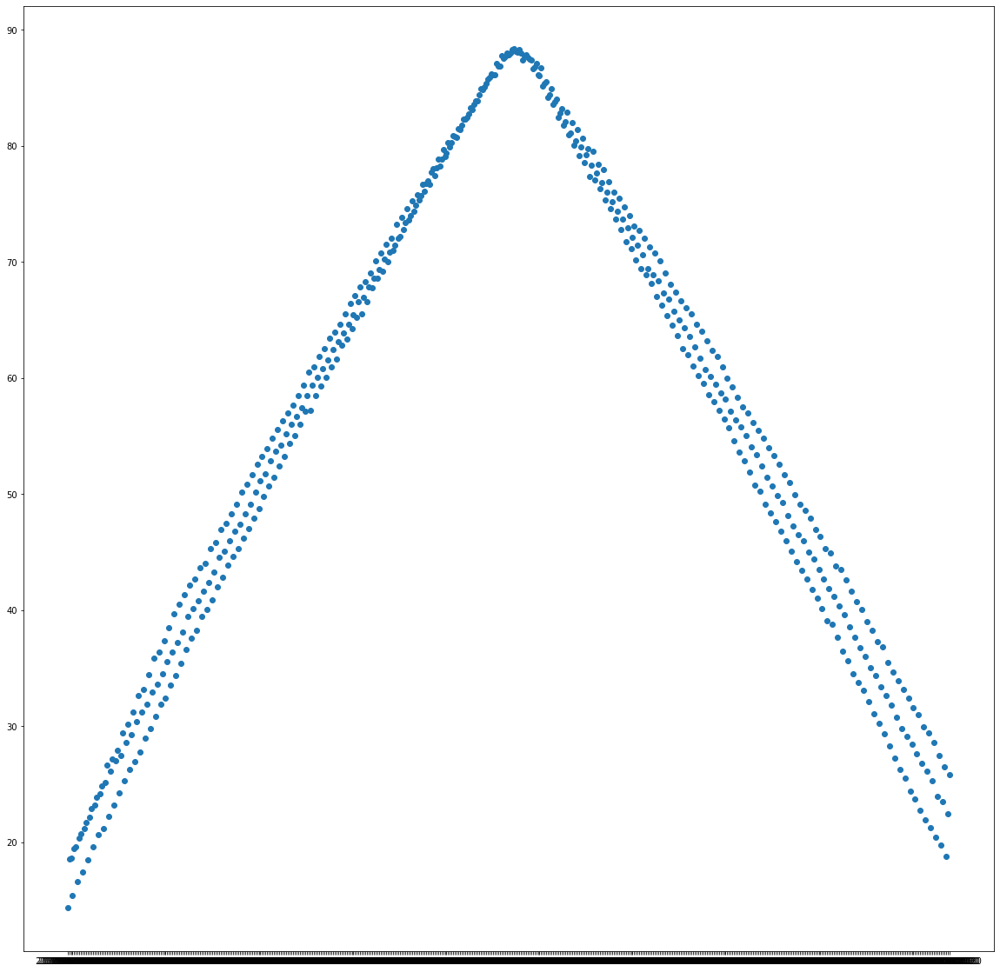

In [10]:
print(len(_pc_), len(_tmptime_), len(_ph_img_jsons_pitch))

fig, ax = plt.subplots(figsize=(20,20))
plt.plot_date(_tmptime_,_ph_img_jsons_pitch)
# plt.plot_date(_pc_,_ph_img_jsons_pitch)

def cropper(orig_1920_1080):
    t = np.flip(np.asarray(orig_1920_1080),axis=0) #dtype=np.int16
    return t[400:1400, :,:]

In [11]:
print(len(_pc_), len(_ph_img_jsons_pitch))
_tmptime_

513 513


['21:45:22 2020',
 '21:45:32 2020',
 '21:45:42 2020',
 '21:45:58 2020',
 '21:46:08 2020',
 '21:46:18 2020',
 '21:46:34 2020',
 '21:46:44 2020',
 '21:46:54 2020',
 '21:47:10 2020',
 '21:47:20 2020',
 '21:47:30 2020',
 '21:47:46 2020',
 '21:47:56 2020',
 '21:48:06 2020',
 '21:48:22 2020',
 '21:48:32 2020',
 '21:48:42 2020',
 '21:48:58 2020',
 '21:49:08 2020',
 '21:49:18 2020',
 '21:49:34 2020',
 '21:49:44 2020',
 '21:49:54 2020',
 '21:50:10 2020',
 '21:50:20 2020',
 '21:50:30 2020',
 '21:50:46 2020',
 '21:50:56 2020',
 '21:51:06 2020',
 '21:51:22 2020',
 '21:51:32 2020',
 '21:51:42 2020',
 '21:51:58 2020',
 '21:52:08 2020',
 '21:52:18 2020',
 '21:52:34 2020',
 '21:52:44 2020',
 '21:52:54 2020',
 '21:53:10 2020',
 '21:53:20 2020',
 '21:53:30 2020',
 '21:53:46 2020',
 '21:53:56 2020',
 '21:54:06 2020',
 '21:54:22 2020',
 '21:54:32 2020',
 '21:54:42 2020',
 '21:54:58 2020',
 '21:55:08 2020',
 '21:55:18 2020',
 '21:55:34 2020',
 '21:55:44 2020',
 '21:55:54 2020',
 '21:56:10 2020',
 '21:56:20

In [12]:
_ph_img_jpgs_,_ph_img_jsons_

(['1014_/jpg/VeggieCamera_crops_picture_20201014_214522.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214532.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214543.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214559.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214608.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214618.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214634.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214645.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214655.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214711.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214721.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214731.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214747.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214757.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214807.jpg',
  '1014_/jpg/VeggieCamera_crops_picture_20201014_214823.jpg',
  '1014_

In [13]:
platform20cm_fname = []
platform10cm_fname = []
platform00cm_fname = []

platform20cm_json = []
platform10cm_json = []
platform00cm_json = []

for i in range(len(_ph_img_jpgs_)//3):
    platform20cm_fname.append(_ph_img_jpgs_[3*i+0])
    platform10cm_fname.append(_ph_img_jpgs_[3*i+1])
    platform00cm_fname.append(_ph_img_jpgs_[3*i+2])
    
    platform20cm_json.append(_ph_img_jsons_[3*i+0])
    platform10cm_json.append(_ph_img_jsons_[3*i+1])
    platform00cm_json.append(_ph_img_jsons_[3*i+2])
    

In [14]:
platform00cm_fname

['1014_/jpg/VeggieCamera_crops_picture_20201014_214543.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_214618.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_214655.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_214731.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_214807.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_214843.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_214919.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_214955.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215031.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215107.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215143.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215219.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215255.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215331.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215407.jpg',
 '1014_/jpg/VeggieCamera_crops_picture_20201014_215443.jpg',
 '1014_/jpg/VeggieCamera

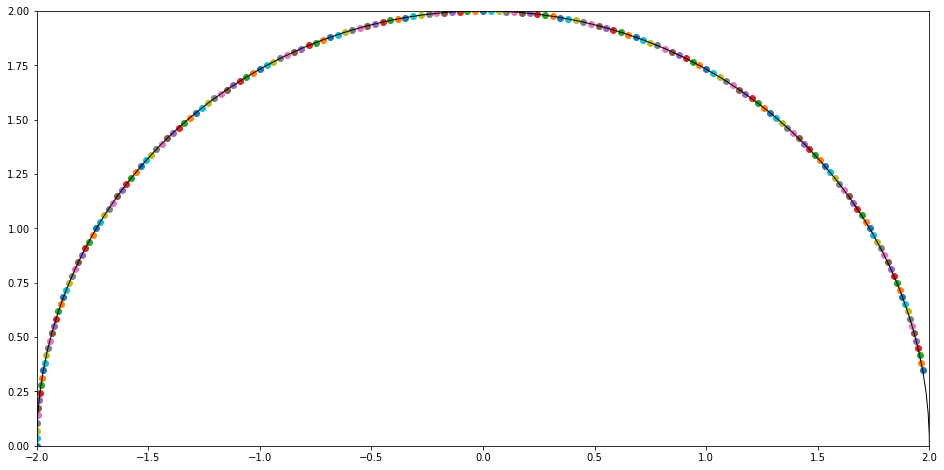

In [15]:
import matplotlib.pyplot as plt

circle1 = plt.Circle((0, 0), 2,fill=False)#, color='r')
# circle2 = plt.Circle((0.5, 0.5), 0.2, color='blue')
# circle3 = plt.Circle((1, 1), 0.2, color='g', clip_on=False)

fig, ax = plt.subplots(figsize = (16,8)) # note we must use plt.subplots, not plt.subplot
# (or if you have an existing figure)
# fig = plt.gcf()
# ax = fig.gca()

ax.add_artist(circle1)
ax.set_ylim(0, 2)
ax.set_xlim(-2, 2)

for alpha in range(10,181,1):
    plt.scatter(np.cos(alpha/180*np.pi)*2, np.sin(alpha/180*np.pi)*2)
    

# ax.add_artist(circle2)
# ax.add_artist(circle3)


In [16]:
# fig = plt.figure(figsize = (16,12)) # note we must use plt.subplots, not plt.subplot
# # (or if you have an existing figure)
# # fig = plt.gcf()
# # ax = fig.gca()

platform20cm_pitch = []
platform10cm_pitch = []
platform00cm_pitch = []


# plt.ylim(-1, 2)
# plt.xlim(-2, 2)
for alpha in range(10,181,1):
#     xx = np.cos(alpha/180*np.pi)*2
#     yy = np.sin(alpha/180*np.pi)*2
#     plt.scatter(xx,yy)
    tmp_dict = json.loads(open(platform20cm_json[alpha-10], 'r').read())
    platform20cm_pitch.append(float(tmp_dict['Pitch']))
    tmp_dict = json.loads(open(platform10cm_json[alpha-10], 'r').read())
    platform10cm_pitch.append(float(tmp_dict['Pitch']))
    tmp_dict = json.loads(open(platform00cm_json[alpha-10], 'r').read())
    platform00cm_pitch.append(float(tmp_dict['Pitch']))

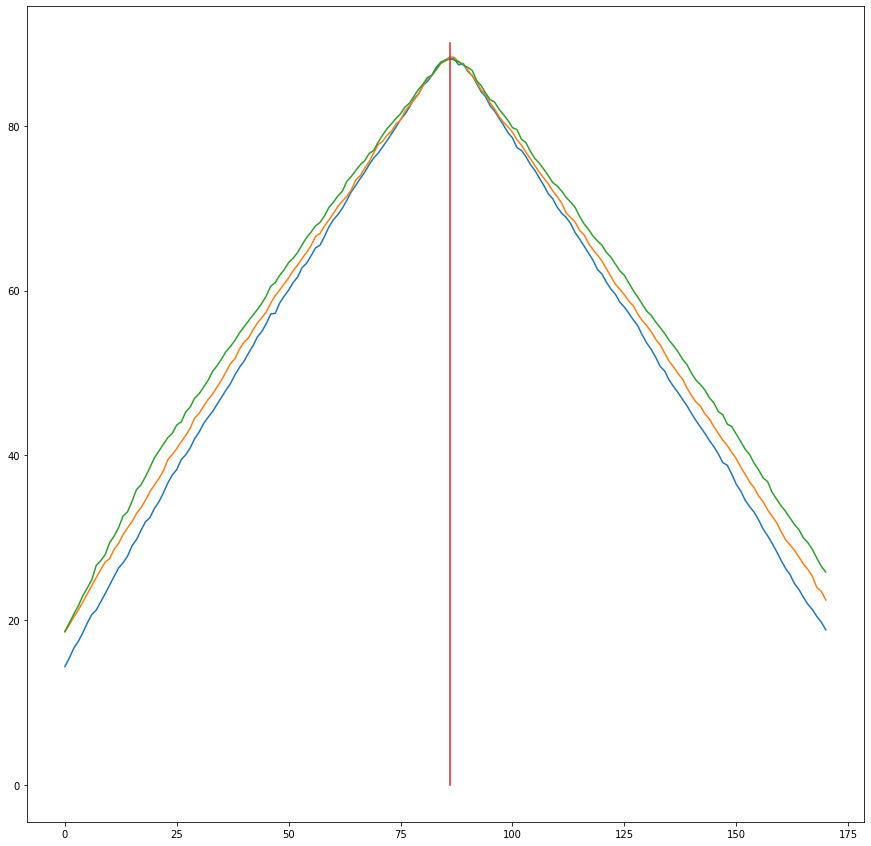

In [17]:
fig, ax = plt.subplots(figsize=(15,15))

plt.plot(platform20cm_pitch)
plt.plot(platform10cm_pitch)
plt.plot(platform00cm_pitch)
plt.plot([86,86] ,[90, 0])

In [18]:
# fig = plt.figure(figsize = (16,12)) # note we must use plt.subplots, not plt.subplot
# # (or if you have an existing figure)
# # fig = plt.gcf()
# # ax = fig.gca()

platform20cm_pitch = []
platform10cm_pitch = []
platform00cm_pitch = []


# plt.ylim(-1, 2)
# plt.xlim(-2, 2)
for alpha in range(10,181,1):
#     xx = np.cos(alpha/180*np.pi)*2
#     yy = np.sin(alpha/180*np.pi)*2
#     plt.scatter(xx,yy)
    if (alpha - 10) < 86:
        tmp_dict = json.loads(open(platform20cm_json[alpha-10], 'r').read())
        platform20cm_pitch.append(float(tmp_dict['Pitch']))
        tmp_dict = json.loads(open(platform10cm_json[alpha-10], 'r').read())
        platform10cm_pitch.append(float(tmp_dict['Pitch']))
        tmp_dict = json.loads(open(platform00cm_json[alpha-10], 'r').read())
        platform00cm_pitch.append(float(tmp_dict['Pitch']))
    else:
        tmp_dict = json.loads(open(platform20cm_json[alpha-10], 'r').read())
        platform20cm_pitch.append(180-float(tmp_dict['Pitch']))
        tmp_dict = json.loads(open(platform10cm_json[alpha-10], 'r').read())
        platform10cm_pitch.append(180-float(tmp_dict['Pitch']))
        tmp_dict = json.loads(open(platform00cm_json[alpha-10], 'r').read())
        platform00cm_pitch.append(180-float(tmp_dict['Pitch']))


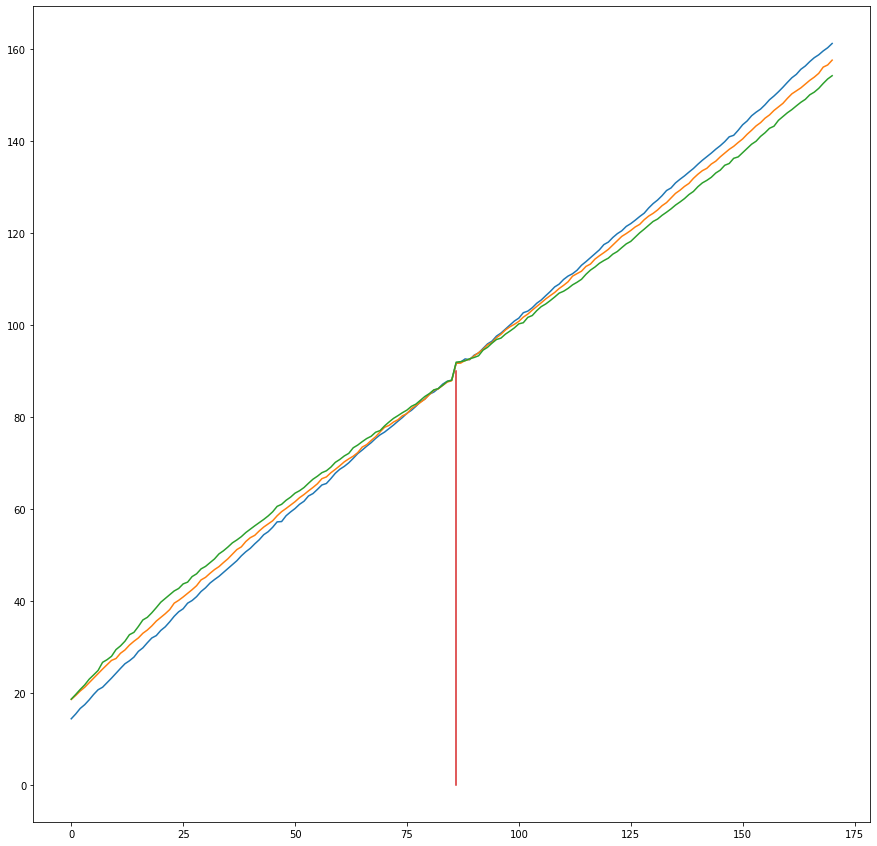

In [19]:
fig, ax = plt.subplots(figsize=(15,15))

plt.plot(range(0, 171,1),platform20cm_pitch)
plt.plot(range(0, 171,1),platform10cm_pitch)
plt.plot(range(0, 171,1),platform00cm_pitch)
plt.plot([86,86] ,[90, 0])

0
0


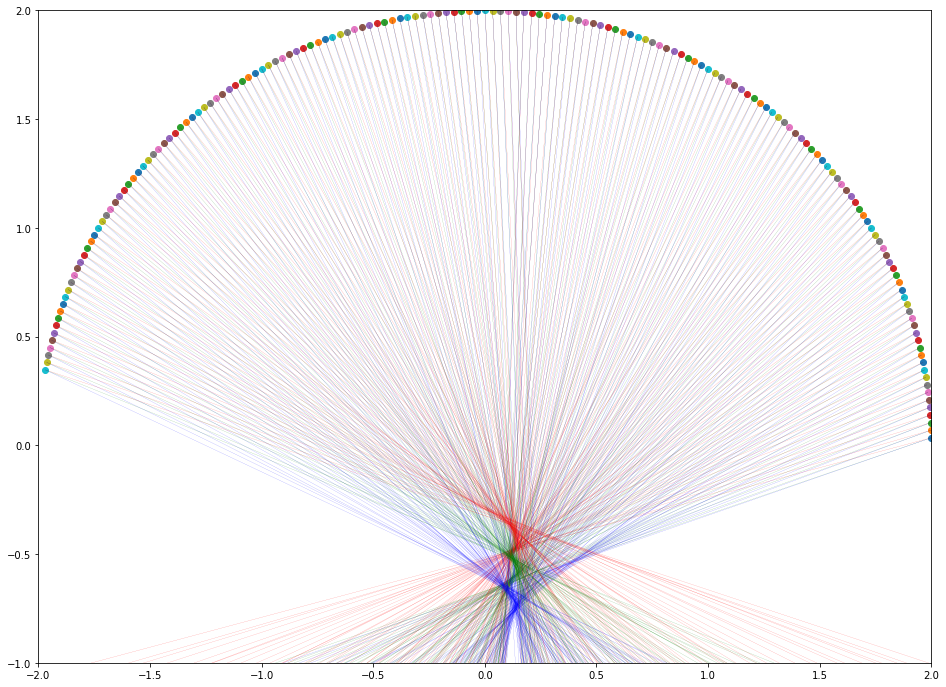

1
1


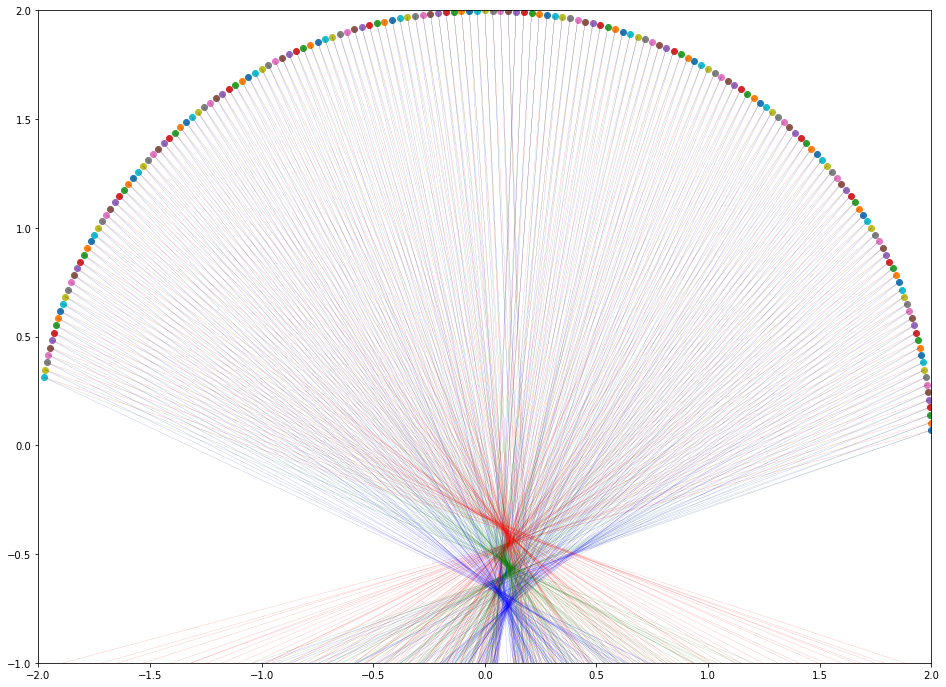

2
2


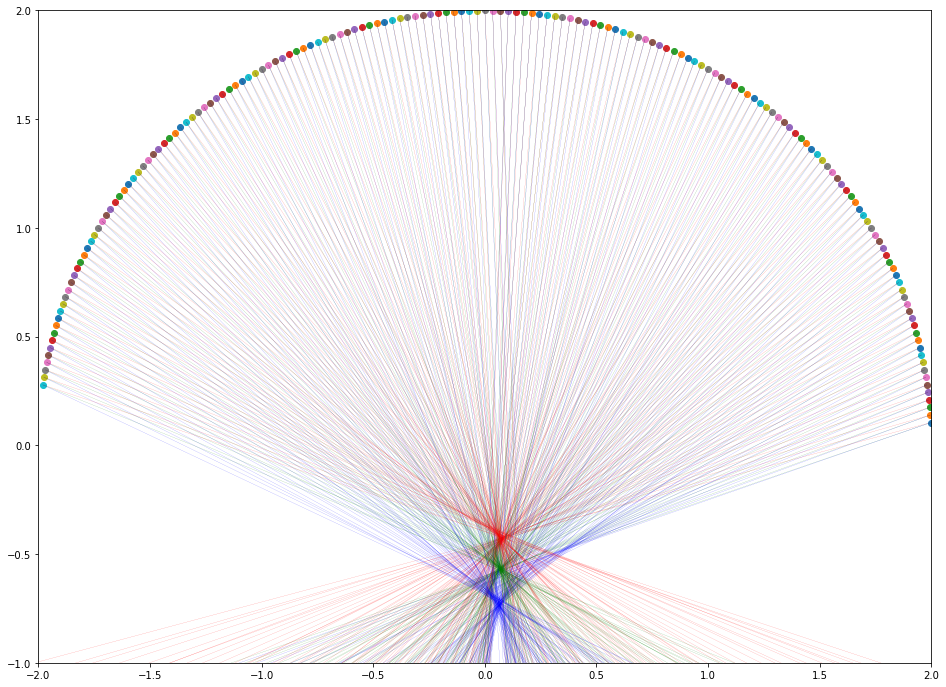

3
3


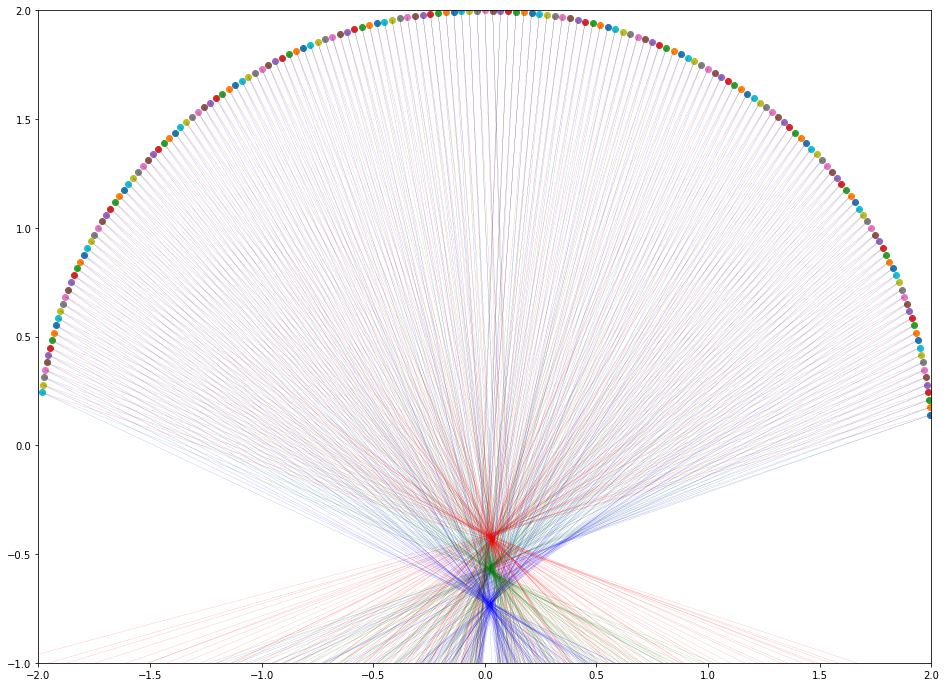

4
4


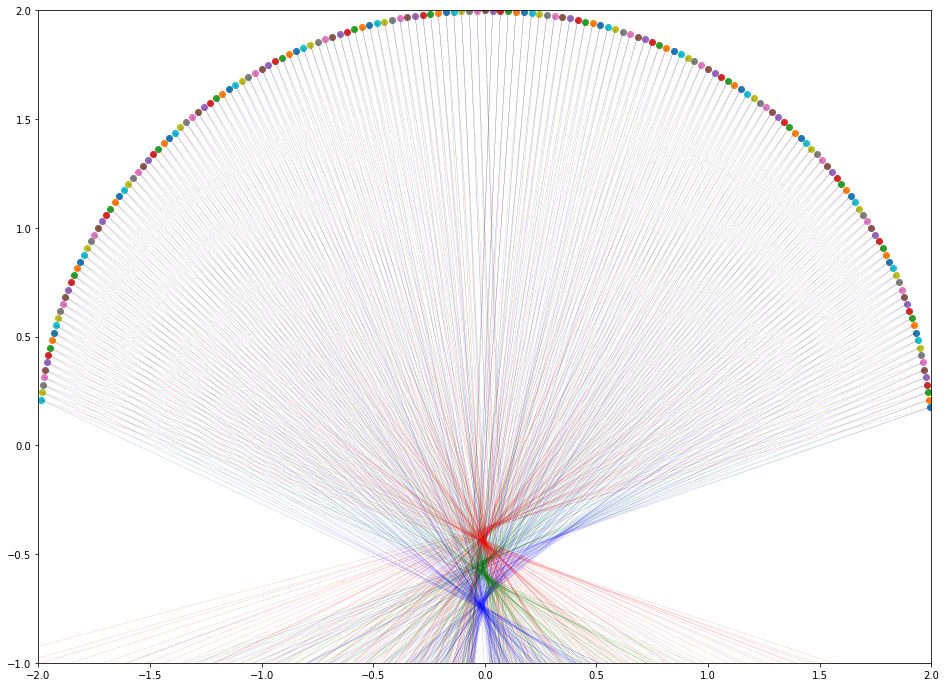

5
5


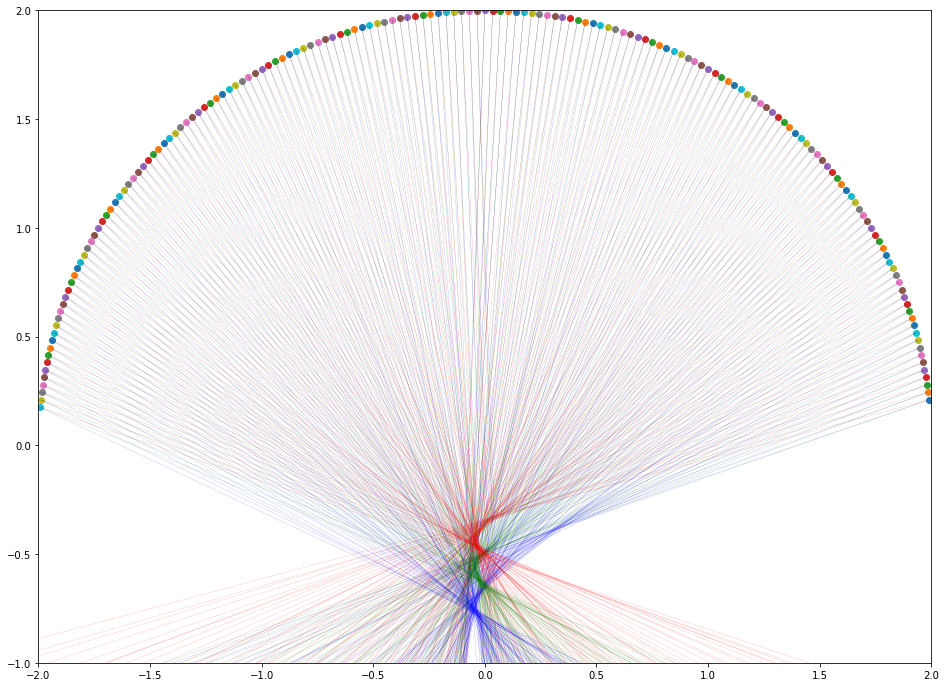

6
6


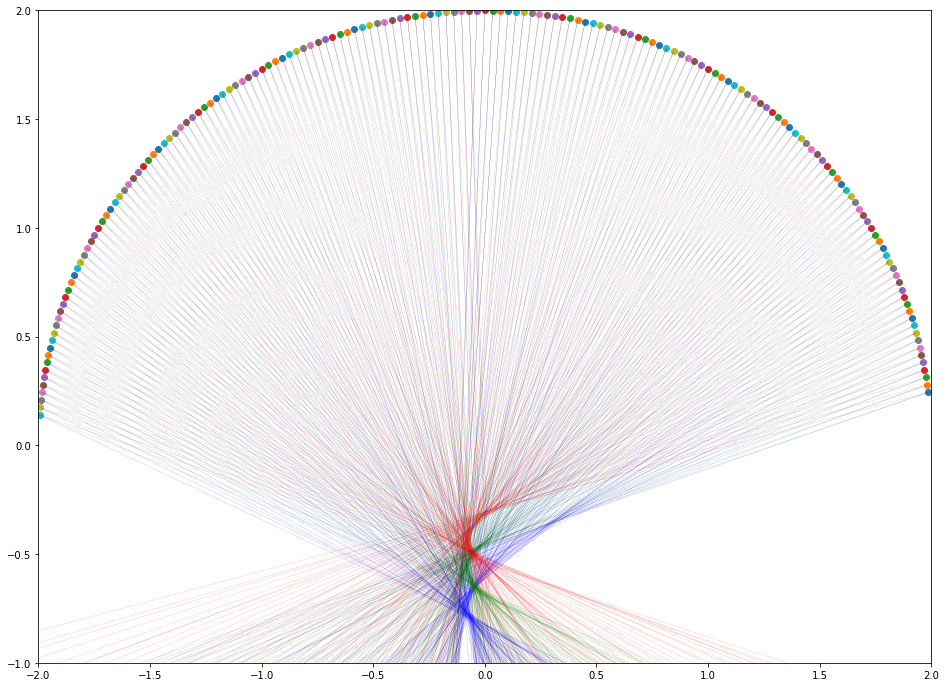

7
7


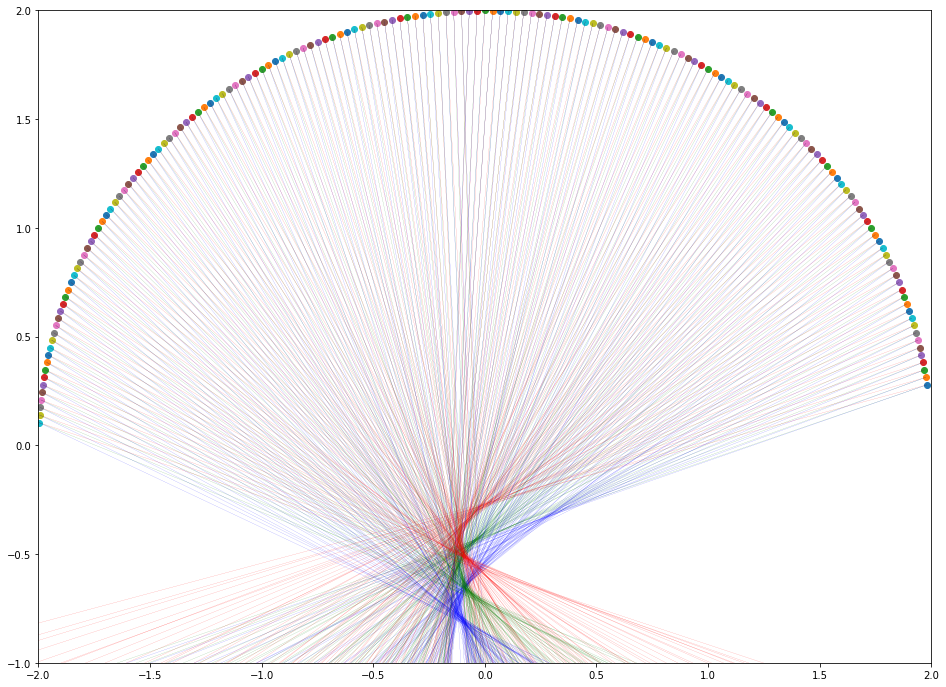

8
8


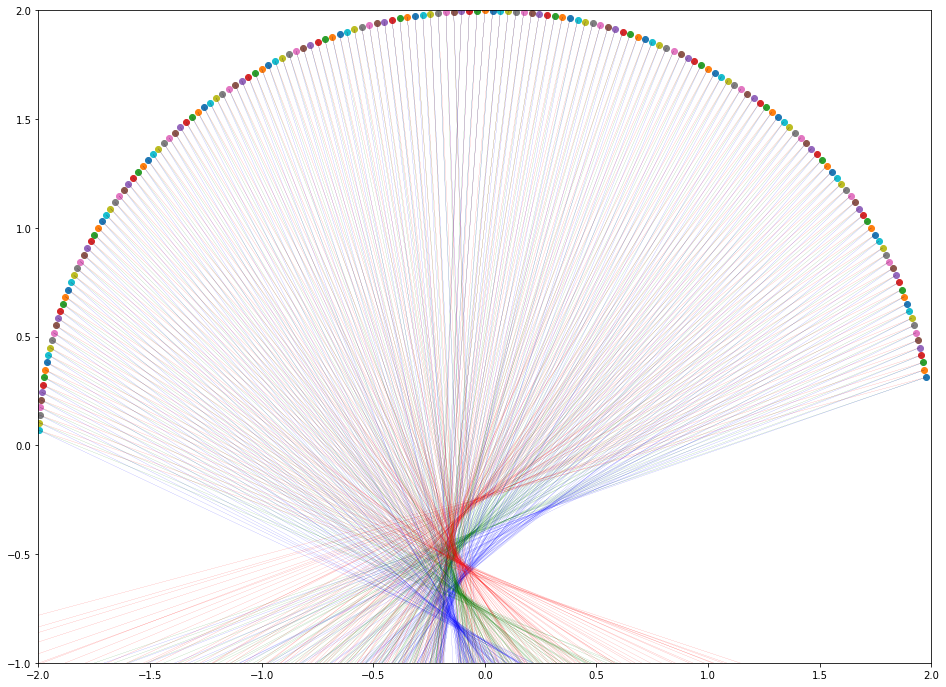

9
9


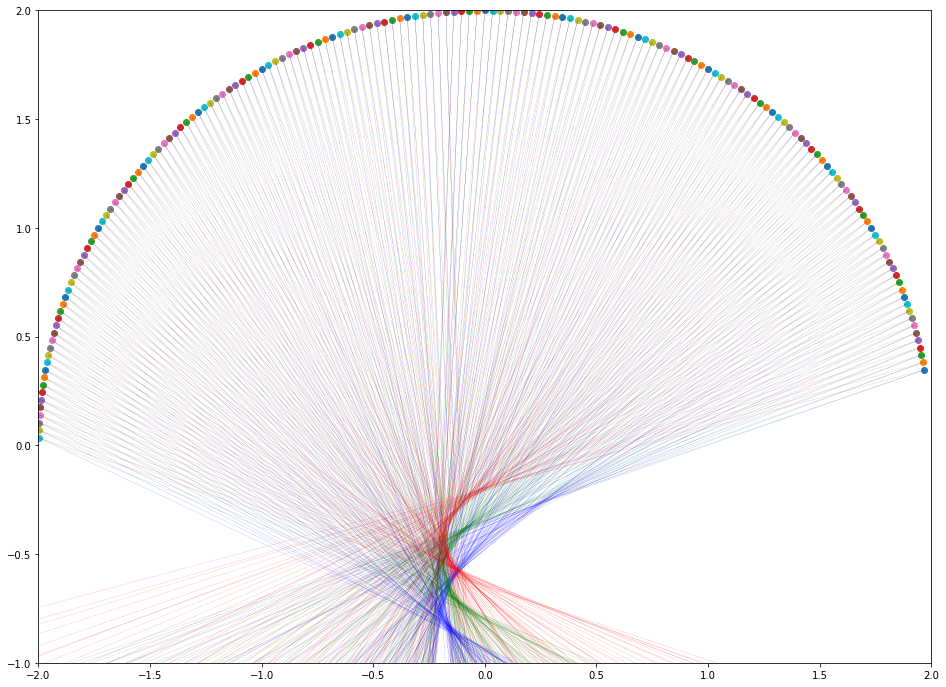

In [20]:
# note we must use plt.subplots, not plt.subplot
# (or if you have an existing figure)
# fig = plt.gcf()
# ax = fig.gca()

# platform20cm_pitch = []
# platform10cm_pitch = []
# platform00cm_pitch = []



for deltaI in range(0,10):
    fig = plt.figure(figsize = (16,12)) 
    
    plt.ylim(-1, 2)
    plt.xlim(-2, 2)
    print(deltaI)

    for i in range(1,171,1):
        xx = np.cos((i+deltaI)/180*np.pi)*2
        yy = np.sin((i+deltaI)/180*np.pi)*2
        plt.scatter(xx,yy)



        xxx = xx - 3 * np.cos(platform20cm_pitch[i]/180*np.pi)*2
        yyy = yy - 3 * np.sin(platform20cm_pitch[i]/180*np.pi)*2
        plt.plot([xxx,xx],[yyy,yy], 'r', linewidth = .1)


        xxx = xx - 3 * np.cos(platform10cm_pitch[i]/180*np.pi)*2
        yyy = yy - 3 * np.sin(platform10cm_pitch[i]/180*np.pi)*2
        plt.plot([xxx,xx],[yyy,yy], 'g', linewidth = .1)


        xxx = xx - 3 * np.cos(platform00cm_pitch[i]/180*np.pi)*2
        yyy = yy - 3 * np.sin(platform00cm_pitch[i]/180*np.pi)*2
        plt.plot([xxx,xx],[yyy,yy], 'b', linewidth = .1)
    print(deltaI)
    plt.show()
#     tmp_dict = json.loads(open(platform20cm_json[alpha-10], 'r').read())
#     platform20cm_pitch.append(float(tmp_dict['Pitch']))
#     tmp_dict = json.loads(open(platform10cm_json[alpha-10], 'r').read())
#     platform10cm_pitch.append(float(tmp_dict['Pitch']))
#     tmp_dict = json.loads(open(platform00cm_json[alpha-10], 'r').read())
#     platform00cm_pitch.append(float(tmp_dict['Pitch']))

In [21]:
platform20cm_pitch

[14.34105279459417,
 15.388600615146318,
 16.58572616342716,
 17.404146750534768,
 18.452691778705738,
 19.62737503292121,
 20.655900776634873,
 21.201170146002625,
 22.199796736624556,
 23.184286543211854,
 24.251537751972197,
 25.29215122296949,
 26.305372220300445,
 26.95194354034324,
 27.748312861715462,
 29.00270783863957,
 29.762952289491594,
 30.874589482573263,
 31.91132340612199,
 32.430759292501456,
 33.546576561355174,
 34.33962982588536,
 35.429642640054766,
 36.62919461303826,
 37.607981211668594,
 38.26298952288364,
 39.481778723664476,
 40.0571197084005,
 40.8982506744984,
 42.01534177363233,
 42.82091819000573,
 43.85143664140974,
 44.61293101687988,
 45.31396455781706,
 46.17055565710128,
 47.04704651253234,
 47.911611857672554,
 48.70957602821598,
 49.77219295362446,
 50.66321162142014,
 51.40480282564886,
 52.383360612942,
 53.26605669523401,
 54.366796321494924,
 55.021821708182905,
 55.98672936241977,
 57.159937295774526,
 57.22665458358721,
 58.49535197663332,
 59

0 171


<ipython-input-25-806139204881>:3: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax1 = plt.subplot()


1 171
2 171
3 171
4 171
5 171
6 171
7 171
8 171
9 171
10 171
11 171
12 171
13 171
14 171
15 171
16 171
17 171
18 171
19 171
20 171
21 171
22 171
23 171
24 171
25 171
26 171
27 171
28 171
29 171
30 171
31 171
32 171
33 171
34 171
35 171
36 171
37 171
38 171
39 171
40 171
41 171
42 171
43 171
44 171
45 171
46 171
47 171
48 171
49 171
50 171
51 171
52 171
53 171
54 171
55 171
56 171
57 171
58 171
59 171
60 171
61 171
62 171
63 171
64 171
65 171
66 171
67 171
68 171
69 171
70 171
71 171
72 171
73 171
74 171
75 171
76 171
77 171
78 171
79 171
80 171
81 171
82 171
83 171
84 171
85 171
86 171
87 171
88 171
89 171
90 171
91 171
92 171
93 171
94 171
95 171
96 171
97 171
98 171
99 171
100 171
101 171
102 171
103 171
104 171
105 171
106 171
107 171
108 171
109 171
110 171
111 171
112 171
113 171
114 171
115 171
116 171
117 171
118 171
119 171
120 171
121 171
122 171
123 171
124 171
125 171
126 171
127 171
128 171
129 171
130 171
131 171
132 171
133 171
134 171
135 171
136 171
137 171
138 171
139 

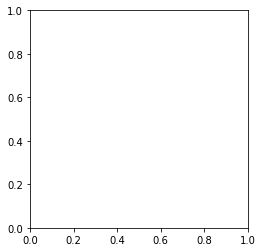

In [25]:
for i in range(171):
    img = cropper(mpimg.imread(platform20cm_fname[i]))
    ax1 = plt.subplot()
    ax1.imshow(img[400:700,:,:])

    rect1 = patches.Rectangle((180, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect2 = patches.Rectangle((390, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect3 = patches.Rectangle((490, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect_ = patches.Rectangle((0, 500-400+170//2), 1000, 1,linewidth=1,edgecolor='y',facecolor='none')
    ax1.add_patch(rect1)
    ax1.add_patch(rect2)
    ax1.add_patch(rect3)
    ax1.add_patch(rect_)
    ax1.text(50, 50, str(i)+ '  center:' + str(i+3)  + '  phone:' + f'{platform20cm_pitch[i]:3.1f}', fontsize=15, c = 'c')
    plt.savefig(dir + "/platforms/20/20cm_" + f'{i:03d}' + ".jpg")
    
    
    
    plt.cla()
    img = cropper(mpimg.imread(platform10cm_fname[i]))
#     ax1 = plt.subplot()
    ax1.imshow(img[400:700,:,:])

    rect1 = patches.Rectangle((180, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect2 = patches.Rectangle((390, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect3 = patches.Rectangle((490, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect_ = patches.Rectangle((0, 500-400+170//2), 1000, 1,linewidth=1,edgecolor='y',facecolor='none')
    ax1.add_patch(rect1)
    ax1.add_patch(rect2)
    ax1.add_patch(rect3)
    ax1.add_patch(rect_)
    ax1.text(50, 50, str(i)+ '  center:' + str(i+3)  + '  phone:' + f'{platform10cm_pitch[i]:3.1f}', fontsize=15, c = 'c')
    plt.savefig(dir + "/platforms/10/10cm_" + f'{i:03d}' + ".jpg")
    
    
    
    plt.cla()
    img = cropper(mpimg.imread(platform00cm_fname[i]))
#     ax1 = plt.subplot()
    ax1.imshow(img[400:700,:,:])

    rect1 = patches.Rectangle((180, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect2 = patches.Rectangle((390, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect3 = patches.Rectangle((490, 500-400), 50, 170,linewidth=1,edgecolor='r',facecolor='none')
    rect_ = patches.Rectangle((0, 500-400+170//2), 1000, 1,linewidth=1,edgecolor='y',facecolor='none')
    ax1.add_patch(rect1)
    ax1.add_patch(rect2)
    ax1.add_patch(rect3)
    ax1.add_patch(rect_)
    ax1.text(50, 50, str(i)+ '  center:' + str(i+3)  + '  phone:' + f'{platform00cm_pitch[i]:3.1f}', fontsize=15, c = 'c')
    plt.savefig(dir + "/platforms/00/00cm_" + f'{i:03d}' + ".jpg")
    
    plt.cla()
    
    print(i,171)
    
    

In [ ]:
from PIL import Image, ImageDraw

images = []

width = 200
center = width // 2
color_1 = (0, 0, 0)
color_2 = (255, 255, 255)
max_radius = int(center * 1.5)
step = 8

for i in range(0, max_radius, step):
    im = Image.new('RGB', (width, width), color_1)
    draw = ImageDraw.Draw(im)
    draw.ellipse((center - i, center - i, center + i, center + i), fill=color_2)
    images.append(im)

for i in range(0, max_radius, step):
    im = Image.new('RGB', (width, width), color_2)
    draw = ImageDraw.Draw(im)
    draw.ellipse((center - i, center - i, center + i, center + i), fill=color_1)
    images.append(im)

images[0].save('pillow_imagedraw.gif',
               save_all=True, append_images=images[1:], optimize=False, duration=40, loop=0)


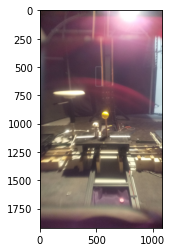

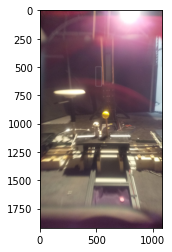

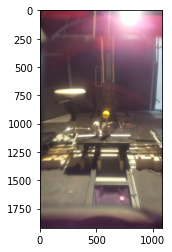

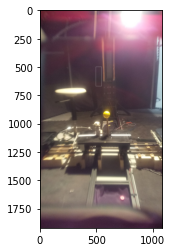

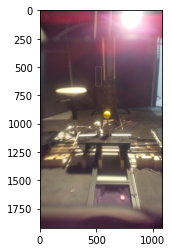

...

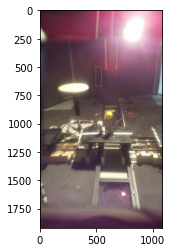

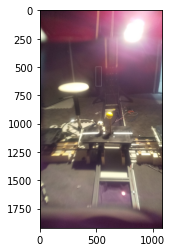

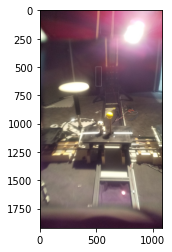

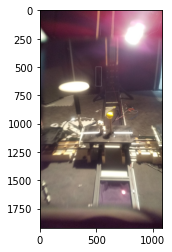

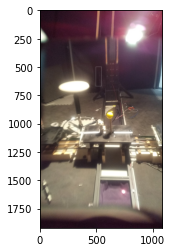

KeyboardInterrupt: 

In [121]:
images = []

for i in range(171):
    im = Image.open(platform20cm_fname[i])
    draw = ImageDraw.Draw(im)
    draw.rectangle([490, 500, 490+50, 500+170])
    images.append(im)
    plt.imshow(np.array(im))
    plt.show()

images[0].save('pillow_imagedraw.gif',
               save_all=True, append_images=images[1:], optimize=False, duration=40, loop=0)
